In [2]:
!pip install transformers torch accelerate Pillow bitsandbytes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.9/270.9 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.0/105.0 MB 2.0 MB/s eta 0:00:00


In [3]:
# For image captioning
from transformers import Blip2Processor, Blip2ForConditionalGeneration
import torch
import accelerate
from accelerate import Accelerator
import torch
from transformers import (
    AutoConfig,
)
import json
from PIL import Image

In [5]:
# model_id = "Salesforce/blip2-opt-2.7b"
model_id = "ethzanalytics/blip2-flan-t5-xl-sharded"

device = "cuda" if torch.cuda.is_available() else "cpu"

In [6]:
# Use accelerator
model_config = AutoConfig.from_pretrained(model_id)

with accelerate.init_empty_weights():
    fake_model = Blip2ForConditionalGeneration(model_config)

device_map=accelerate.infer_auto_device_map(fake_model, max_memory={0: "6GiB", "cpu": "8GiB"}) #
print(json.dumps(device_map, indent=4))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/7.77k [00:00<?, ?B/s]

{
    "query_tokens": 0,
    "vision_model": 0,
    "qformer": 0,
    "language_projection": 0,
    "language_model.shared": 0,
    "language_model.decoder.embed_tokens": 0,
    "language_model.encoder.embed_tokens": 0,
    "language_model.encoder.block.0": 0,
    "language_model.encoder.block.1": 0,
    "language_model.encoder.block.2": 0,
    "language_model.encoder.block.3": 0,
    "language_model.encoder.block.4": 0,
    "language_model.encoder.block.5": 0,
    "language_model.encoder.block.6": 0,
    "language_model.encoder.block.7": 0,
    "language_model.encoder.block.9": "cpu",
    "language_model.encoder.block.10": "cpu",
    "language_model.encoder.block.11": "cpu",
    "language_model.encoder.block.12": "cpu",
    "language_model.encoder.block.13": "cpu",
    "language_model.encoder.block.14": "cpu",
    "language_model.encoder.block.15": "cpu",
    "language_model.encoder.block.16": "cpu",
    "language_model.encoder.block.17": "cpu",
    "language_model.encoder.block.18": 

In [7]:
processor = Blip2Processor.from_pretrained(model_id)
model = Blip2ForConditionalGeneration.from_pretrained(
    model_id, load_in_8bit=True, device_map={"": Accelerator().local_process_index}, torch_dtype=torch.float16
)

preprocessor_config.json:   0%|          | 0.00/431 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.69k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/58.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.27k [00:00<?, ?B/s]

pytorch_model.bin.index.json:   0%|          | 0.00/128k [00:00<?, ?B/s]

pytorch_model-00001-of-00009.bin:   0%|          | 0.00/1.99G [00:00<?, ?B/s]

pytorch_model-00002-of-00009.bin:   0%|          | 0.00/2.00G [00:00<?, ?B/s]

pytorch_model-00003-of-00009.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

pytorch_model-00004-of-00009.bin:   0%|          | 0.00/1.97G [00:00<?, ?B/s]

pytorch_model-00005-of-00009.bin:   0%|          | 0.00/1.98G [00:00<?, ?B/s]

pytorch_model-00006-of-00009.bin:   0%|          | 0.00/2.00G [00:00<?, ?B/s]

pytorch_model-00007-of-00009.bin:   0%|          | 0.00/1.99G [00:00<?, ?B/s]

pytorch_model-00008-of-00009.bin:   0%|          | 0.00/2.00G [00:00<?, ?B/s]

pytorch_model-00009-of-00009.bin:   0%|          | 0.00/389M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/9 [00:00<?, ?it/s]

In [25]:
def get_image_captions(image, prompt="Question: what is the emotion in the image? Answer:"):
    print(image) # file name

    image = Image.open(image).convert('RGB')
    resized_image = image.resize((400, 300))
    display(resized_image)
    print(prompt)

    inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)

    inputs = processor(images=image, return_tensors="pt").to(device="cuda", dtype=torch.float16)

    generated_ids = model.generate(**inputs)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
    print(generated_text)
    return generated_text

In [9]:
import os

In [10]:
def videoCaptions(video_file, prompt="Question: what is the emotion in the image? Answer:", max_captions=4):
    """Returns a list of captions for the video."""
    video_captions = []
    images_folder = os.path.join("input", video_file.split(".")[0])
    count = 0
    for image in os.listdir(images_folder):
        caption = get_image_captions(os.path.join(images_folder, image), prompt)
        video_captions.append(caption)
    return video_captions

input/dia1utt1/frame4.jpg


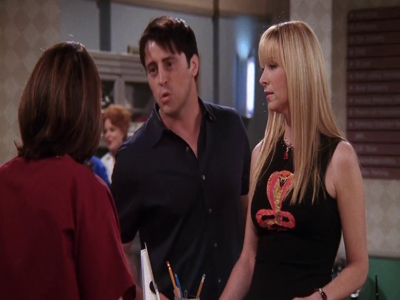

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1273: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


['joy']
input/dia1utt1/frame12.jpg


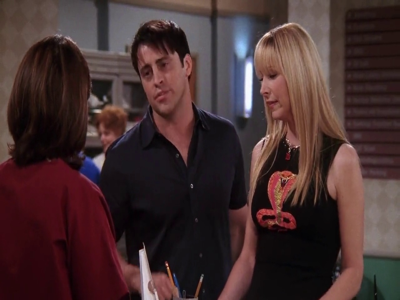

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame3.jpg


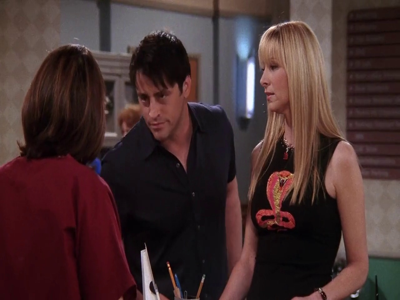

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame2.jpg


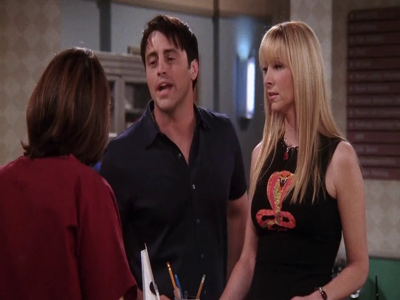

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame5.jpg


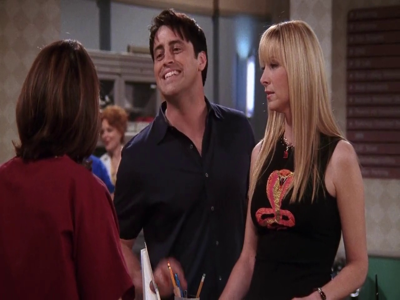

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame9.jpg


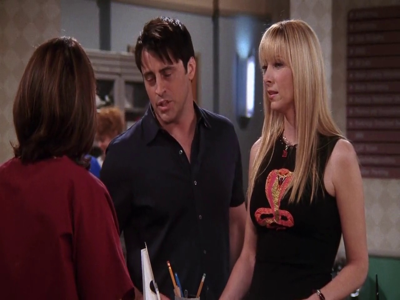

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame10.jpg


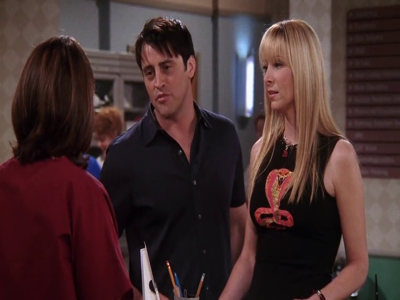

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame0.jpg


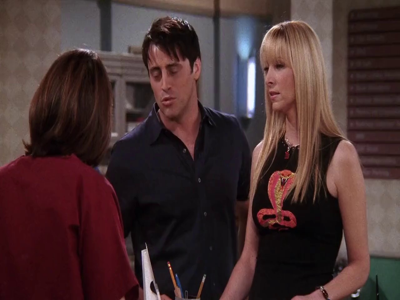

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame11.jpg


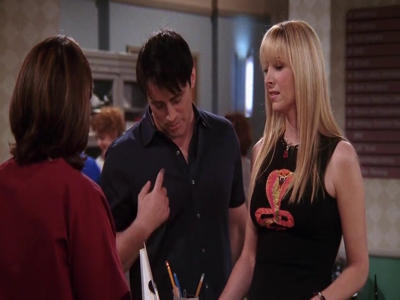

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame7.jpg


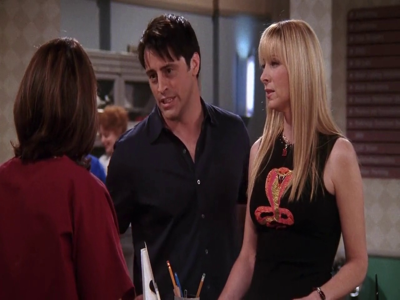

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame1.jpg


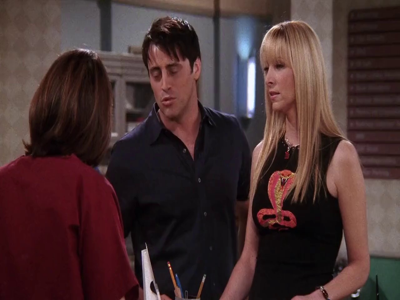

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame8.jpg


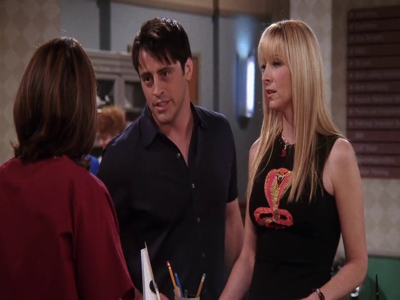

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
input/dia1utt1/frame6.jpg


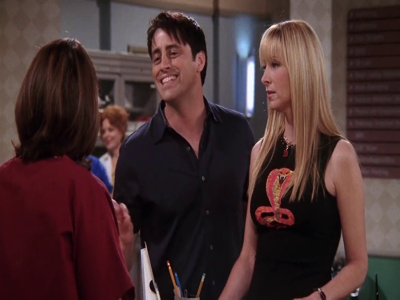

Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
['joy']
[['joy'], ['joy'], ['joy'], ['joy'], ['joy'], ['joy'], ['joy'], ['joy'], ['joy'], ['joy'], ['joy'], ['joy'], ['joy']]


In [16]:
list_captions = videoCaptions("dia1utt1.mp4", "Question: which emotions are expressed by the people out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:") # gave list of emotions
print(list_captions)

input/dia1utt1/frame4.jpg


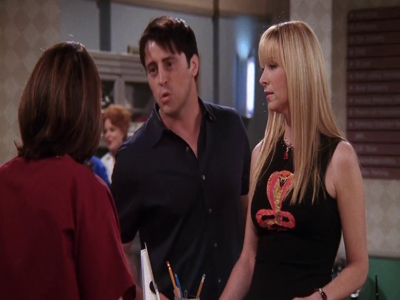

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1273: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


fear
input/dia1utt1/frame12.jpg


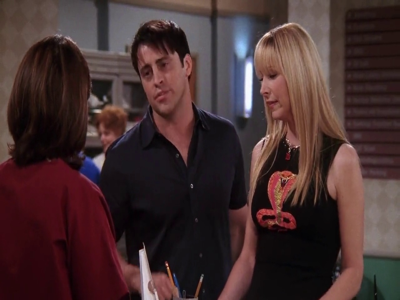

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame3.jpg


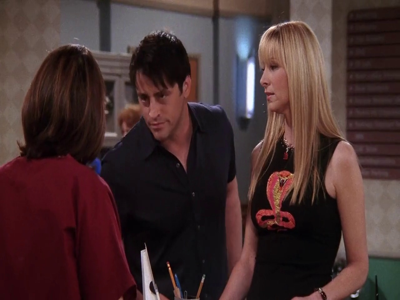

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame2.jpg


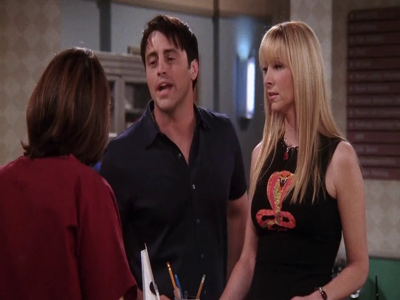

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame5.jpg


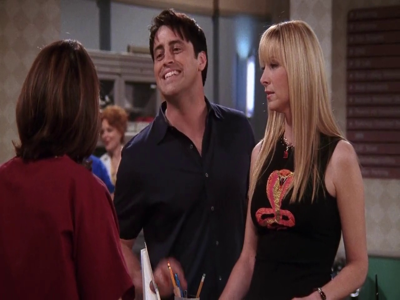

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame9.jpg


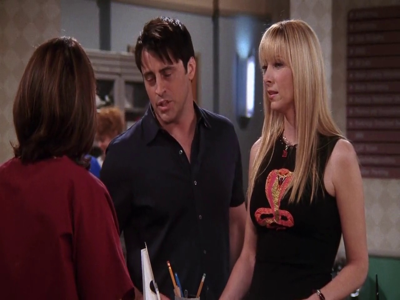

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame10.jpg


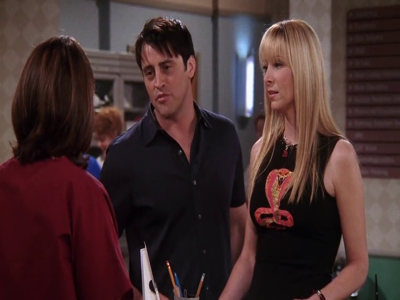

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame0.jpg


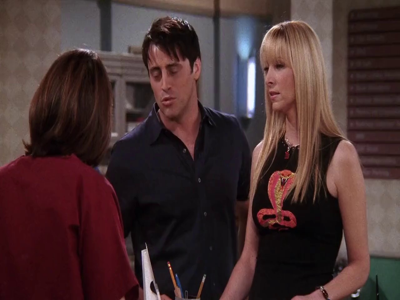

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame11.jpg


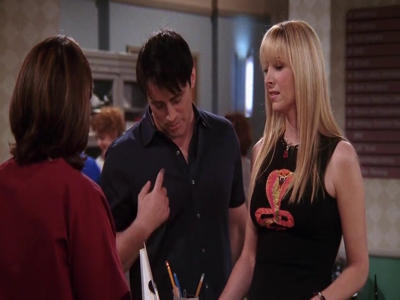

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame7.jpg


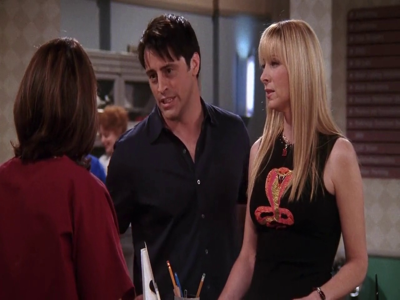

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame1.jpg


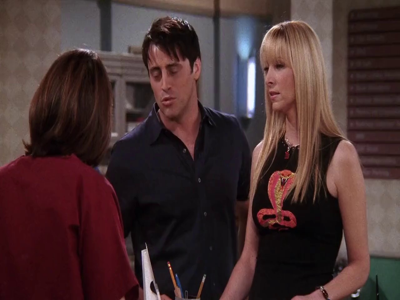

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame8.jpg


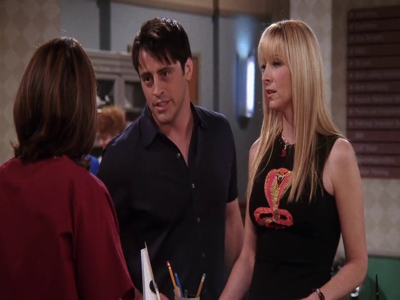

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
fear
input/dia1utt1/frame6.jpg


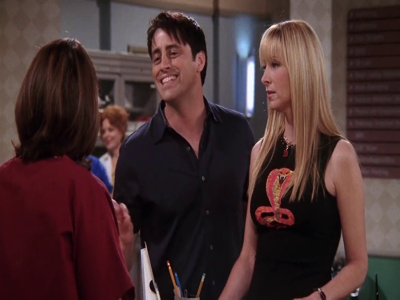

Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
['fear', 'fear', 'fear', 'fear', 'joy', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'joy']


In [18]:
list_captions = videoCaptions("dia1utt1.mp4", "Question: which emotion is expressed out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:") # gave list of emotions
print(list_captions)

input/dia1utt1/frame4.jpg


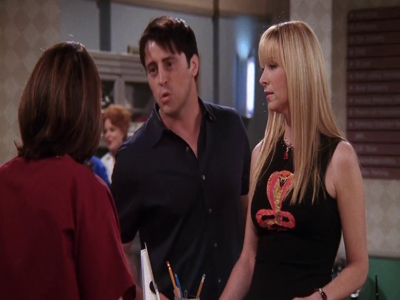

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame12.jpg


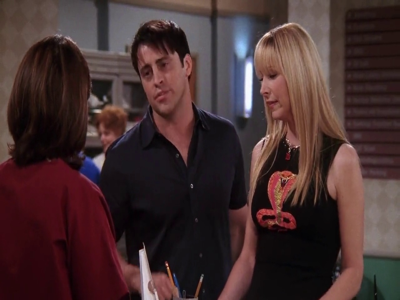

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame3.jpg


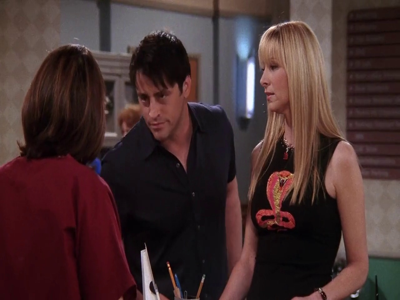

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame2.jpg


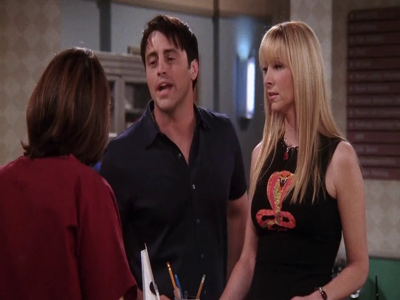

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame5.jpg


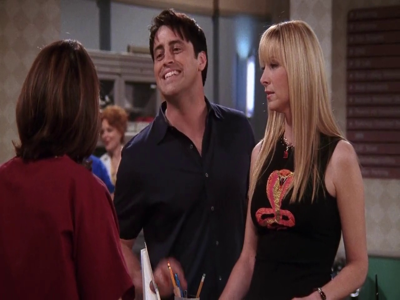

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame9.jpg


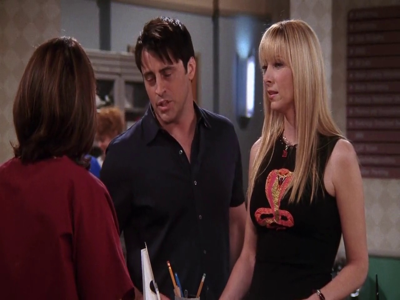

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame10.jpg


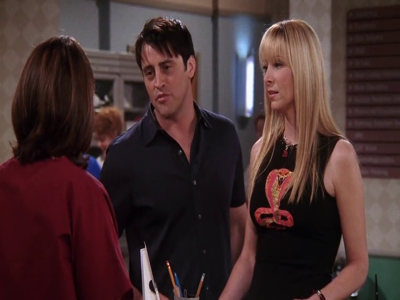

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame0.jpg


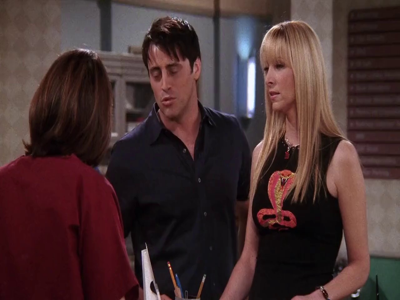

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame11.jpg


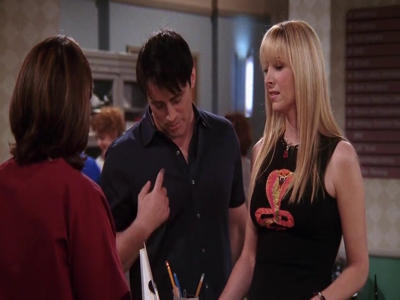

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame7.jpg


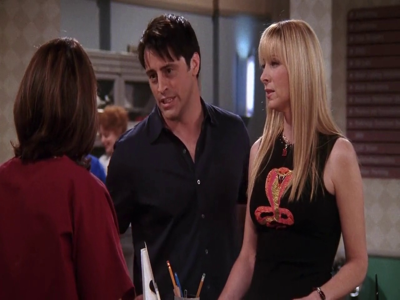

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame1.jpg


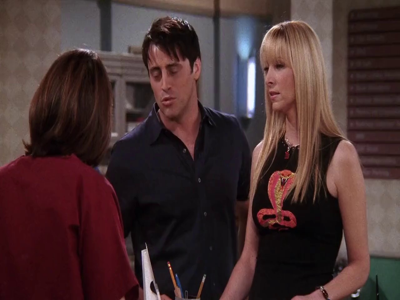

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame8.jpg


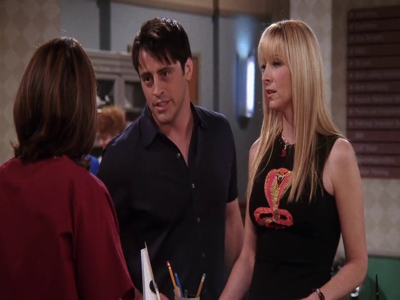

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
input/dia1utt1/frame6.jpg


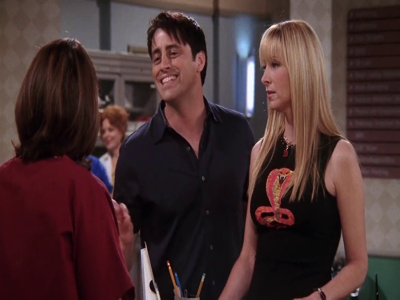

Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:
joy
['joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy']


In [19]:
list_captions = videoCaptions("dia1utt1.mp4", "Question: which emotion is expressed by joey out of anger, joy, fear, suprise, sadness, disgust, neutral? Answer:") # gave list of emotions
print(list_captions)

input/dia1utt1/frame4.jpg


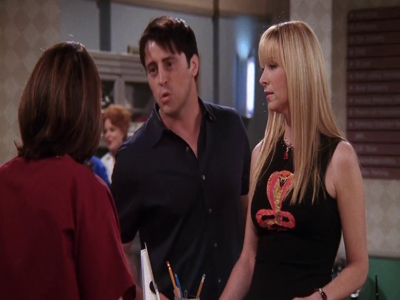

which emotions are expressed?
a man and woman are talking to each other
input/dia1utt1/frame12.jpg


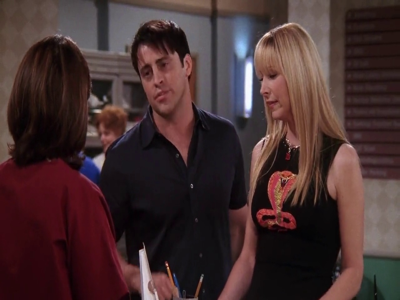

which emotions are expressed?
astonishment, fear, and anger
input/dia1utt1/frame3.jpg


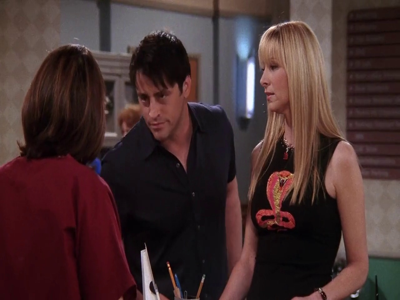

which emotions are expressed?
a man and woman are talking to each other
input/dia1utt1/frame2.jpg


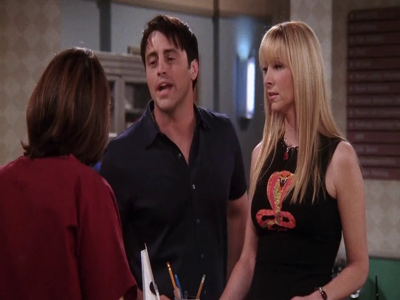

which emotions are expressed?
a man and woman are talking to each other
input/dia1utt1/frame5.jpg


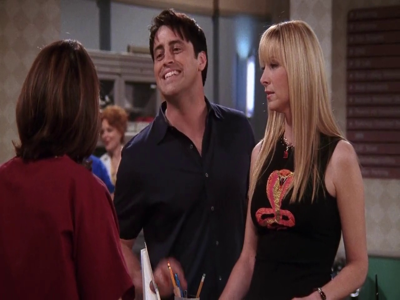

which emotions are expressed?
happy, sad, excited, and sad
input/dia1utt1/frame9.jpg


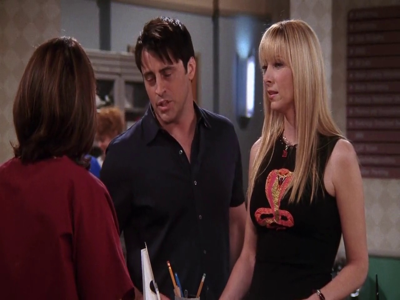

which emotions are expressed?
a man and woman are talking to each other
input/dia1utt1/frame10.jpg


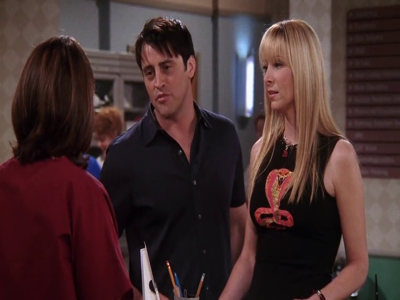

which emotions are expressed?
a man and woman are talking to each other
input/dia1utt1/frame0.jpg


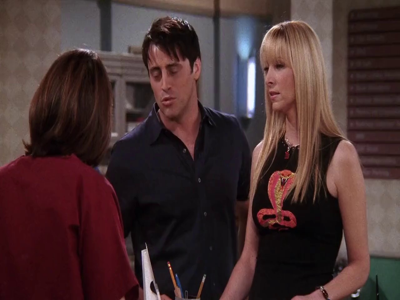

which emotions are expressed?
a man and woman are talking to each other
input/dia1utt1/frame11.jpg


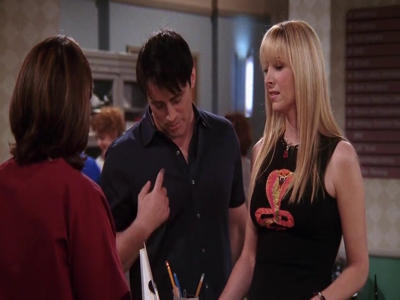

which emotions are expressed?
a woman is upset about her boyfriend's behavior
input/dia1utt1/frame7.jpg


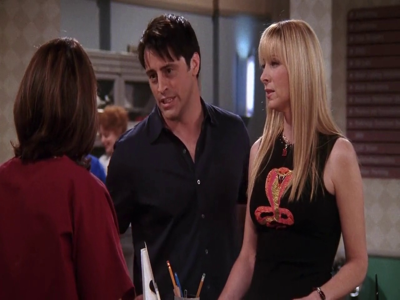

which emotions are expressed?
a man and woman are talking to each other
input/dia1utt1/frame1.jpg


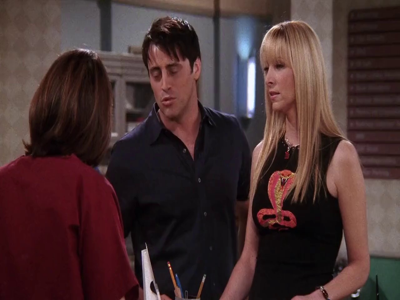

which emotions are expressed?
a man and woman are talking to each other
input/dia1utt1/frame8.jpg


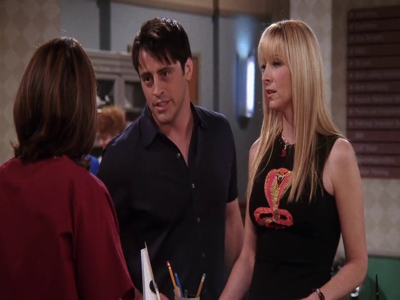

which emotions are expressed?
a man and woman are talking to each other
input/dia1utt1/frame6.jpg


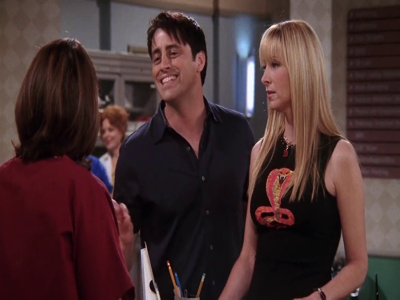

which emotions are expressed?
happiness, sadness, and anger
['a man and woman are talking to each other', 'astonishment, fear, and anger', 'a man and woman are talking to each other', 'a man and woman are talking to each other', 'happy, sad, excited, and sad', 'a man and woman are talking to each other', 'a man and woman are talking to each other', 'a man and woman are talking to each other', "a woman is upset about her boyfriend's behavior", 'a man and woman are talking to each other', 'a man and woman are talking to each other', 'a man and woman are talking to each other', 'happiness, sadness, and anger']


In [20]:
list_captions = videoCaptions("dia1utt1.mp4", "which emotions are expressed?")
print(list_captions)

input/dia1utt1/frame4.jpg


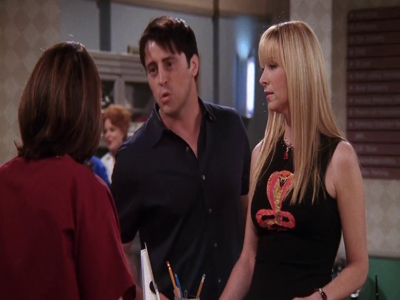

which emotion is expressed by joey?
awe
input/dia1utt1/frame12.jpg


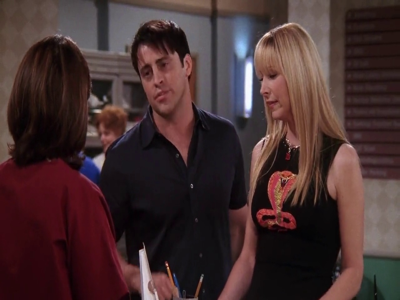

which emotion is expressed by joey?
awe
input/dia1utt1/frame3.jpg


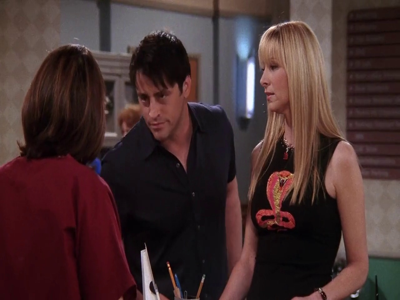

which emotion is expressed by joey?
awe
input/dia1utt1/frame2.jpg


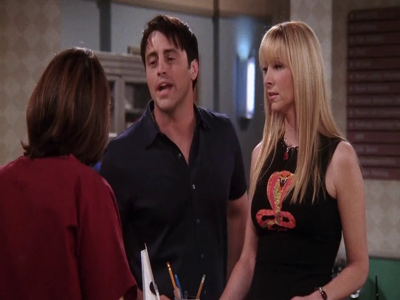

which emotion is expressed by joey?
awe
input/dia1utt1/frame5.jpg


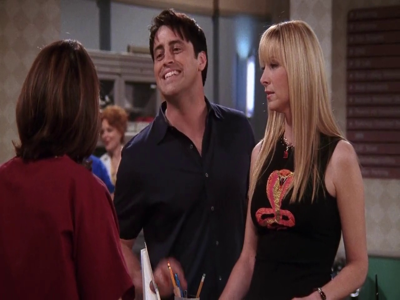

which emotion is expressed by joey?
happy
input/dia1utt1/frame9.jpg


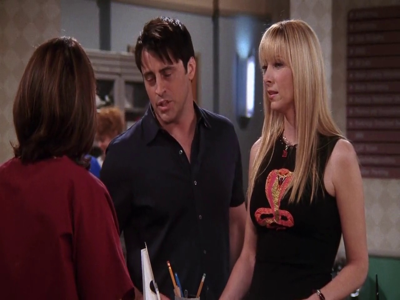

which emotion is expressed by joey?
awe
input/dia1utt1/frame10.jpg


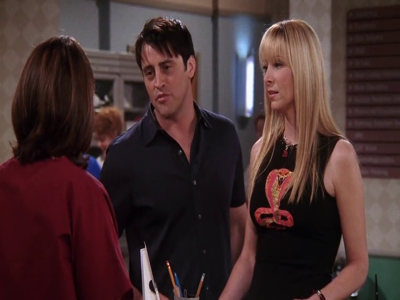

which emotion is expressed by joey?
awe
input/dia1utt1/frame0.jpg


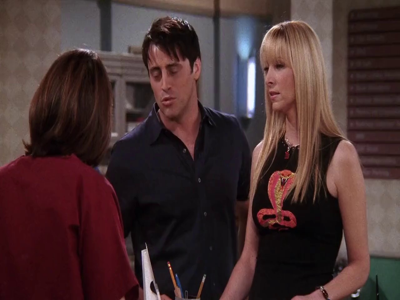

which emotion is expressed by joey?
awe
input/dia1utt1/frame11.jpg


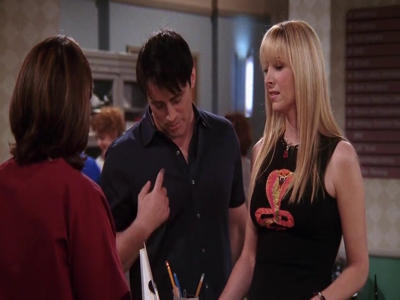

which emotion is expressed by joey?
awe
input/dia1utt1/frame7.jpg


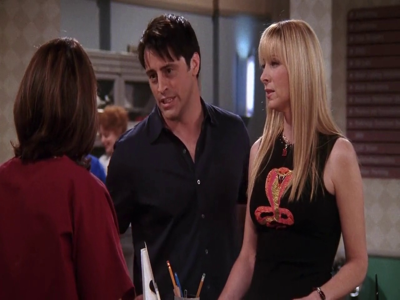

which emotion is expressed by joey?
awe
input/dia1utt1/frame1.jpg


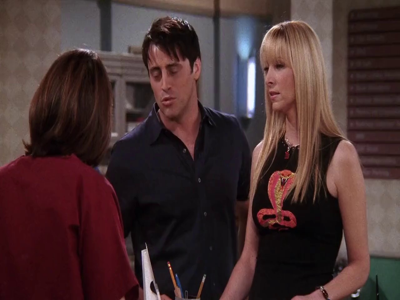

which emotion is expressed by joey?
awe
input/dia1utt1/frame8.jpg


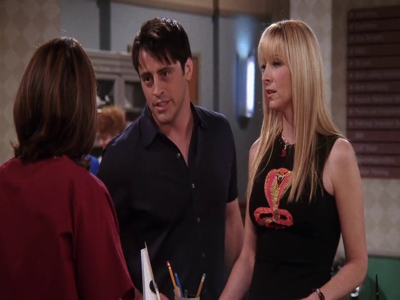

which emotion is expressed by joey?
awe
input/dia1utt1/frame6.jpg


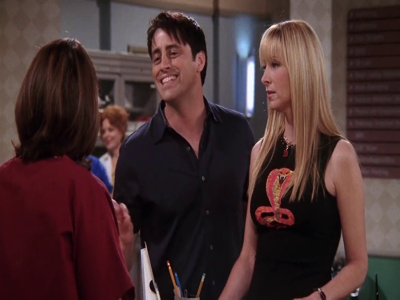

which emotion is expressed by joey?
happy
['awe', 'awe', 'awe', 'awe', 'happy', 'awe', 'awe', 'awe', 'awe', 'awe', 'awe', 'awe', 'happy']


In [23]:
list_captions = videoCaptions("dia1utt1.mp4", "which emotion is expressed by joey?")
print(list_captions)

input/dia1utt1/frame4.jpg


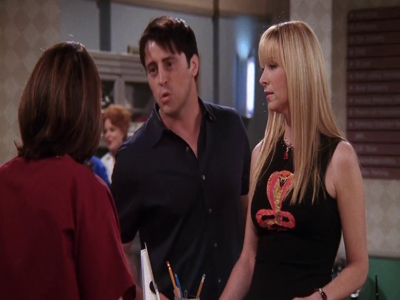

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame12.jpg


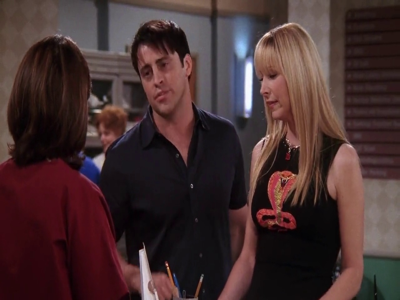

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame3.jpg


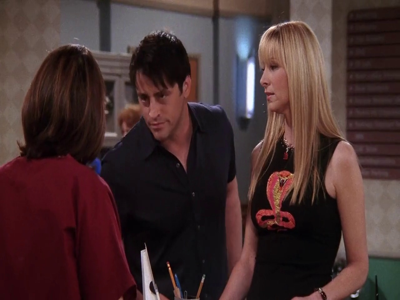

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame2.jpg


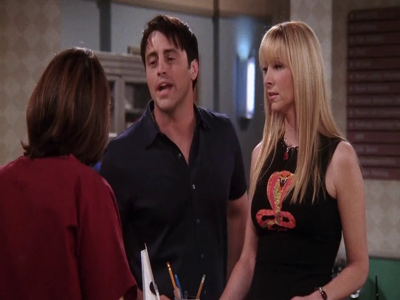

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame5.jpg


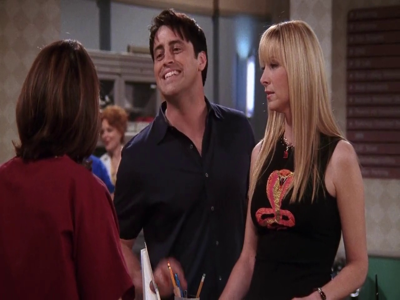

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame9.jpg


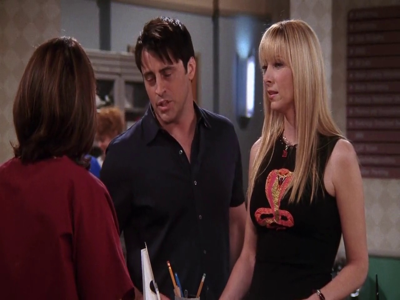

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame10.jpg


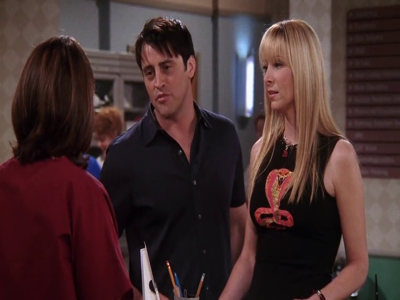

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame0.jpg


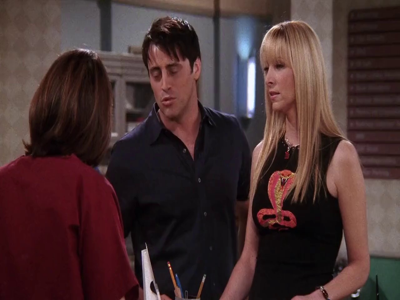

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame11.jpg


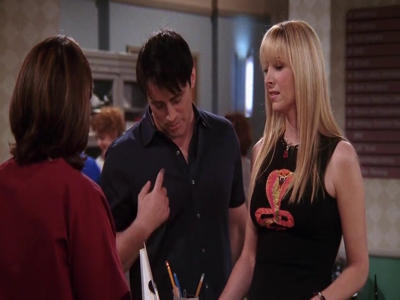

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame7.jpg


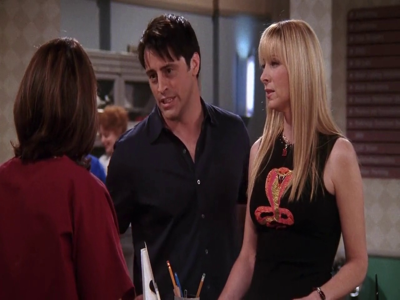

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame1.jpg


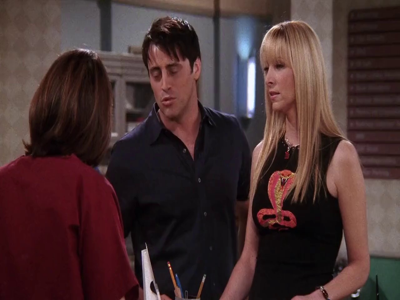

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame8.jpg


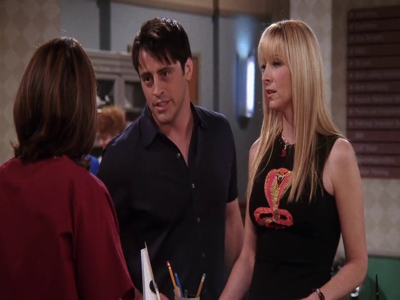

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
input/dia1utt1/frame6.jpg


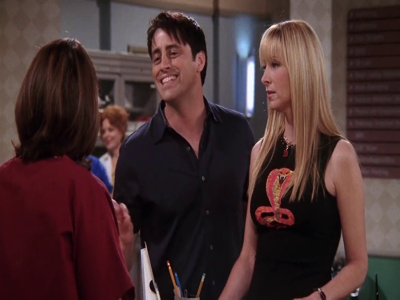

which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?
joy
['joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy']


In [24]:
list_captions = videoCaptions("dia1utt1.mp4", "which emotion is expressed by joey out of anger, fear, disgust, surprise, joy, sadness, neutral?")
print(list_captions)

input/dia1utt1/frame4.jpg


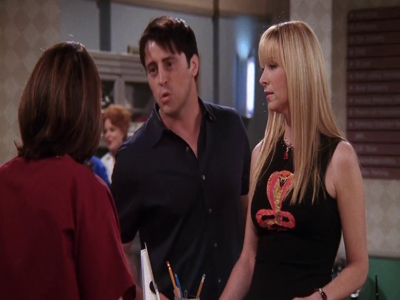

Question: what is the emotion in the image? Answer:
a woman and man talking in a hospital
input/dia1utt1/frame12.jpg


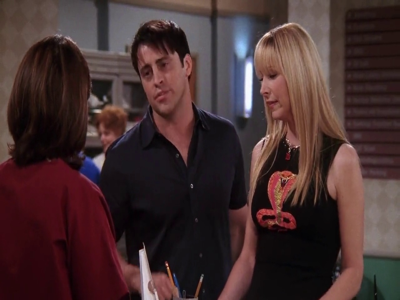

Question: what is the emotion in the image? Answer:
a man and woman talking in a kitchen
input/dia1utt1/frame3.jpg


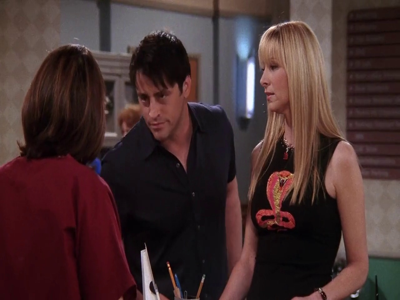

Question: what is the emotion in the image? Answer:
a man and woman talking to each other in a hospital
input/dia1utt1/frame2.jpg


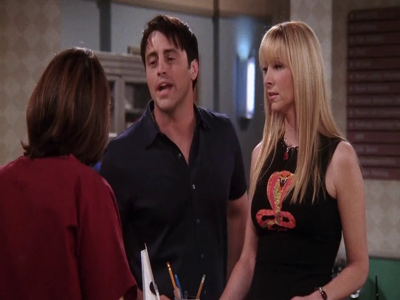

Question: what is the emotion in the image? Answer:
a man and woman talking to each other in a hospital
input/dia1utt1/frame5.jpg


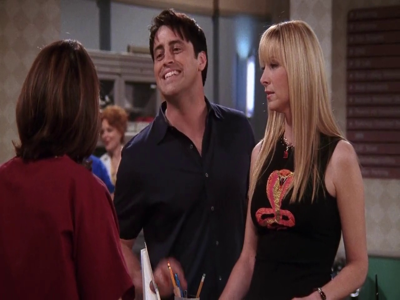

Question: what is the emotion in the image? Answer:
a man and woman are talking to each other in a kitchen
input/dia1utt1/frame9.jpg


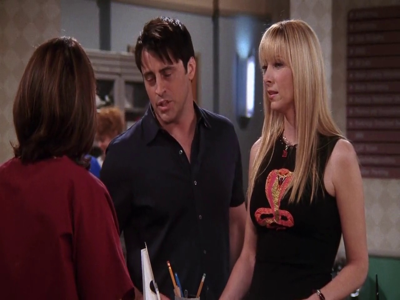

Question: what is the emotion in the image? Answer:
a man and woman talking to each other in a hospital
input/dia1utt1/frame10.jpg


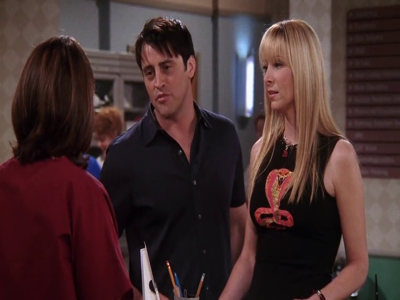

Question: what is the emotion in the image? Answer:
a man and woman talking to each other in a kitchen
input/dia1utt1/frame0.jpg


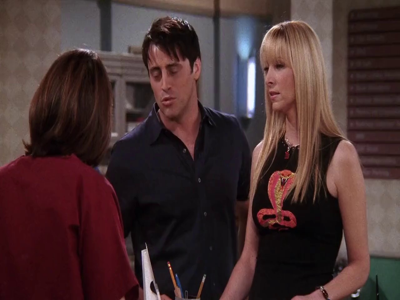

Question: what is the emotion in the image? Answer:
a man and woman talking to each other in a hospital
input/dia1utt1/frame11.jpg


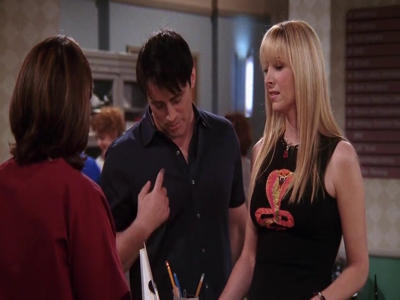

Question: what is the emotion in the image? Answer:
a woman is talking to a man in a kitchen
input/dia1utt1/frame7.jpg


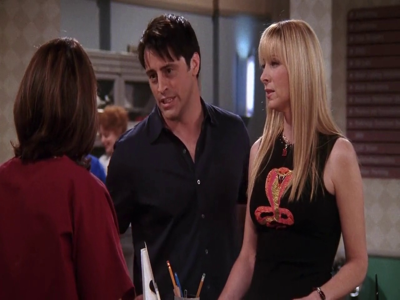

Question: what is the emotion in the image? Answer:
a man and woman talking in a kitchen
input/dia1utt1/frame1.jpg


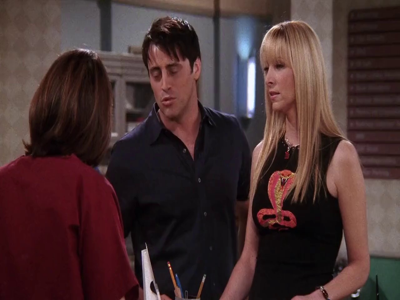

Question: what is the emotion in the image? Answer:
a man and woman talking to each other in a hospital
input/dia1utt1/frame8.jpg


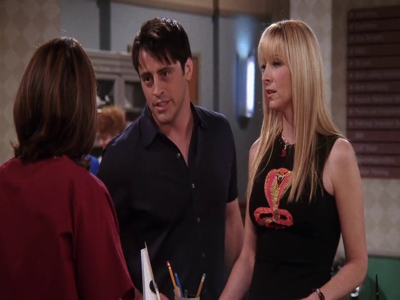

Question: what is the emotion in the image? Answer:
a man and woman talking to each other in a hospital
input/dia1utt1/frame6.jpg


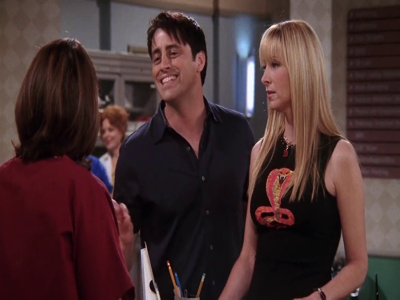

Question: what is the emotion in the image? Answer:
a man and woman are talking to each other in a kitchen
['a woman and man talking in a hospital', 'a man and woman talking in a kitchen', 'a man and woman talking to each other in a hospital', 'a man and woman talking to each other in a hospital', 'a man and woman are talking to each other in a kitchen', 'a man and woman talking to each other in a hospital', 'a man and woman talking to each other in a kitchen', 'a man and woman talking to each other in a hospital', 'a woman is talking to a man in a kitchen', 'a man and woman talking in a kitchen', 'a man and woman talking to each other in a hospital', 'a man and woman talking to each other in a hospital', 'a man and woman are talking to each other in a kitchen']


In [26]:
list_captions = videoCaptions("dia1utt1.mp4")
print(list_captions)

Note: BLIP2 works best for simple question answering. Could not be used for long descriptions and complex emotion extraction.